In [1]:
# Author: Priti Gupta
# Date: June 27th, 2023
# Objective: Analyzing Uber ride data yields valuable insights that inform decision-making and drive business success

### Details of the dataset:

The dataset contains information about the Datetime, Latitude, Longitude and Base of each uber ride that happened in the month of April 2014 to Sep 2014 at New York City, USA. The dataset is obtained from Kaggle.

Kaggle dataset link: https://www.kaggle.com/datasets/fivethirtyeight/uber-pickups-in-new-york-city?select=uber-raw-data-jul14.csv

`Features in the data set`

`Date/Time` : The date and time of the Uber pickup

`Lat` : The latitude of the Uber pickup

`Lon` : The longitude of the Uber pickup

`Base` : The TLC base company code affiliated with the Uber pickup

The Base codes are for the following Uber bases:

B02512 : Unter

B02598 : Hinter

B02617 : Weiter

B02682 : Schmecken

B02764 : Danach-NY

### Project description

Analyzing Uber ride data yields valuable insights that inform decision-making and drive business success:

1. `Operational Efficiency`: Identify pickup patterns to optimize driver allocation, reduce wait times, and meet peak demand efficiently.

2. `Customer Experience`: Understand pickup times and locations to minimize wait times, enhance satisfaction, and improve overall service quality.

3. `Pricing Strategies`: Analyze ride patterns and demand fluctuations to implement effective pricing strategies and maximize revenue potential.

4. `Targeted Marketing`: Segment customers based on behavior and preferences to create personalized promotions, loyalty programs, and targeted marketing campaigns.

5. `Expansion Planning`: Leverage geospatial analysis to identify high-demand areas for service expansion, resource allocation, and new driver hubs.

6. `Predictive Insights`: Build models to forecast ride demand, enabling proactive planning, resource management, and maintaining a seamless customer experience.

7. `Performance Evaluation`: Assess performance metrics like pickup time and travel time to ensure high-quality services and identify areas for improvement.

By harnessing the power of data analysis, Uber can make informed decisions, optimize operations, enhance customer satisfaction, and stay ahead in the competitive ride-hailing industry.

### EDA script

In [2]:
# importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [3]:
#importing the dataset for the month of april. Later, we can also compare the months and check how the patterns differ

data_april = pd.read_csv('dataset/uber-raw-data-apr14.csv')

In [4]:
data_april.head(10)

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
5,4/1/2014 0:33:00,40.7383,-74.0403,B02512
6,4/1/2014 0:39:00,40.7223,-73.9887,B02512
7,4/1/2014 0:45:00,40.7620,-73.9790,B02512
8,4/1/2014 0:55:00,40.7524,-73.9960,B02512
9,4/1/2014 1:01:00,40.7575,-73.9846,B02512


In [5]:
# changing the date and time into consistent format using pandas

#The following function can convert a string representation of a date or time into a pandas datetime object.
#This allows for easy manipulation and analysis of dates and times in pandas.
data_april['Date/Time'] = pd.to_datetime(data_april['Date/Time'])

In [6]:
# The format is changed.
data_april.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [7]:
# Let us extract additional columns from the datetime data
data_april['Day'] = data_april['Date/Time'].dt.day
data_april['Hour'] = data_april['Date/Time'].dt.hour
data_april['Weekday'] = data_april['Date/Time'].dt.weekday

In [8]:
data_april.tail(200000)

,Date/Time,Lat,Lon,Base,Day,Hour,Weekday
364516,2014-04-05 15:36:00,40.7536,-73.9660,B02682,5,15,5
364517,2014-04-05 15:37:00,40.7601,-73.9732,B02682,5,15,5
364518,2014-04-05 15:37:00,40.7423,-73.9894,B02682,5,15,5
364519,2014-04-05 15:37:00,40.7863,-73.9716,B02682,5,15,5
364520,2014-04-05 15:37:00,40.7867,-73.9778,B02682,5,15,5
...,...,...,...,...,...,...,...
564511,2014-04-30 23:22:00,40.7640,-73.9744,B02764,30,23,2
564512,2014-04-30 23:26:00,40.7629,-73.9672,B02764,30,23,2
564513,2014-04-30 23:31:00,40.7443,-73.9889,B02764,30,23,2
564514,2014-04-30 23:32:00,40.6756,-73.9405,B02764,30,23,2


In [9]:
data_april['Weekday'].value_counts()

Weekday
2    108631
1     91185
4     90303
3     85067
5     77218
0     60861
6     51251
Name: count, dtype: int64

In [10]:
# 1. Analyze rides by day of the month
rides_by_day = data_april.groupby('Day').size().reset_index(name='Rides')
print('Rides by Day of the Month:')
print(rides_by_day)

# The rides_by_day DataFrame has two columns: 'Day' and 'Rides'. 
# The 'Day' column represents the unique days from the original data, and the 'Rides' column contains the count of rides for each day.

Rides by Day of the Month:
    Day  Rides
0     1  14546
1     2  17474
2     3  20701
3     4  26714
4     5  19521
5     6  13445
6     7  19550
7     8  16188
8     9  16843
9    10  20041
10   11  20420
11   12  18170
12   13  12112
13   14  12674
14   15  20641
15   16  17717
16   17  20973
17   18  18074
18   19  14602
19   20  11017
20   21  13162
21   22  16975
22   23  20346
23   24  23352
24   25  25095
25   26  24925
26   27  14677
27   28  15475
28   29  22835
29   30  36251


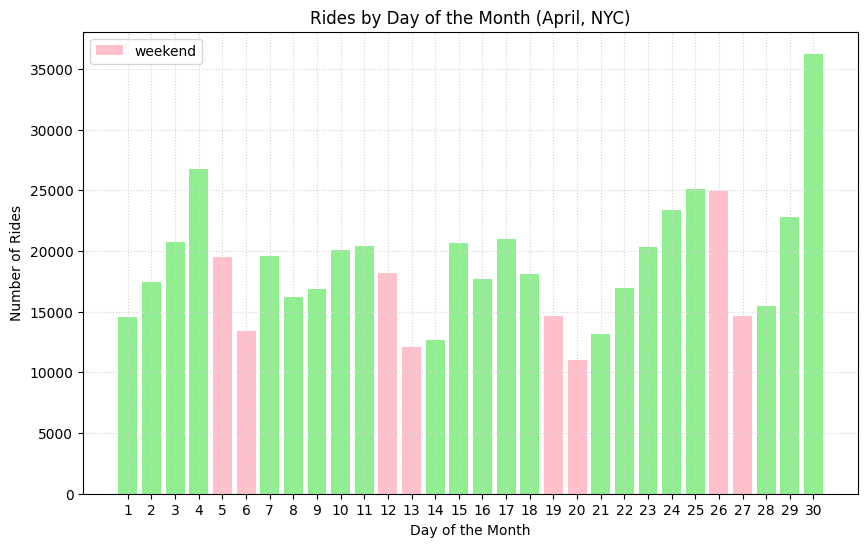

In [11]:
# 2. Visualize rides by day of the month

# Create a bar plot with ticks from 1 to 30
plt.figure(figsize=(10, 6))
plt.bar(rides_by_day['Day'], rides_by_day['Rides'],color = 'lightgreen')
plt.xlabel('Day of the Month')
plt.ylabel('Number of Rides')
plt.title('Rides by Day of the Month (April, NYC)')
plt.xticks(range(1, 31))  # Set the x-axis ticks from 1 to 30
plt.grid(color='lightgray', linestyle='dotted')

# Highlight weekend bars
weekend_days = data_april[data_april['Weekday'] >= 5]['Day'].unique()
for day in weekend_days[:-1]:
    plt.bar(day, rides_by_day.loc[rides_by_day['Day'] == day, 'Rides'], color='pink')
for day in weekend_days[-1:]:
    plt.bar(day, rides_by_day.loc[rides_by_day['Day'] == day, 'Rides'], color='pink',label= 'weekend')

plt.grid(color='lightgray', linestyle='dotted')  # Set grid lines to be lighter and dotted
plt.legend()
plt.show()

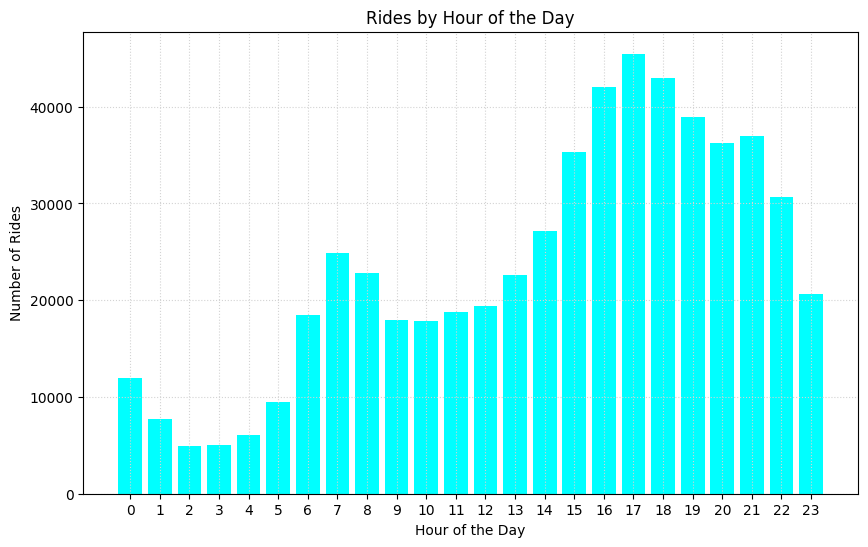

In [12]:
# 3. Analyze rides by hour of the day
rides_by_hour = data_april.groupby('Hour').size().reset_index(name='Rides')
#print('Rides by Hour of the Day:')
#print(rides_by_hour)

# 4. Visualize rides by hour of the day
plt.figure(figsize=(10, 6))
plt.bar(rides_by_hour['Hour'], rides_by_hour['Rides'], color = 'cyan')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.title('Rides by Hour of the Day')
plt.xticks(range(0, 24))  # Set the x-axis ticks from 1 to 30
plt.grid(color='lightgray', linestyle='dotted')
plt.show()

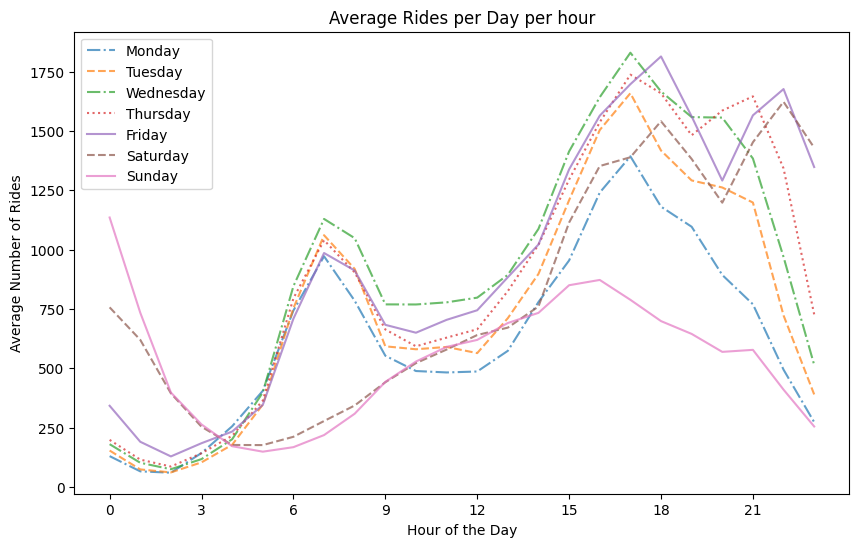

In [13]:
# analysis of average rides per day 

import matplotlib.pyplot as plt

days_name = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
line_styles = ['-.', '--', '-.', ':', '-', '--', '-']  # Example line styles for each day

# Create a line plot for average rides per day per time
plt.figure(figsize=(10, 6))
for i in range(0, 7):
    avg_rides = data_april[data_april['Weekday'] == i].groupby(['Day', 'Hour']).size().reset_index(name='Rides')
    avg_rides = avg_rides.groupby('Hour')['Rides'].mean().reset_index(name='Average Rides')
    plt.plot(avg_rides['Hour'], avg_rides['Average Rides'], label=days_name[i], linestyle=line_styles[i], alpha=0.7)

plt.xlabel('Hour of the Day')
plt.ylabel('Average Number of Rides')
plt.title('Average Rides per Day per hour')

plt.xticks(range(0, 24, 3))  # Set x-axis ticks for every 3 hours
plt.legend()
plt.show()


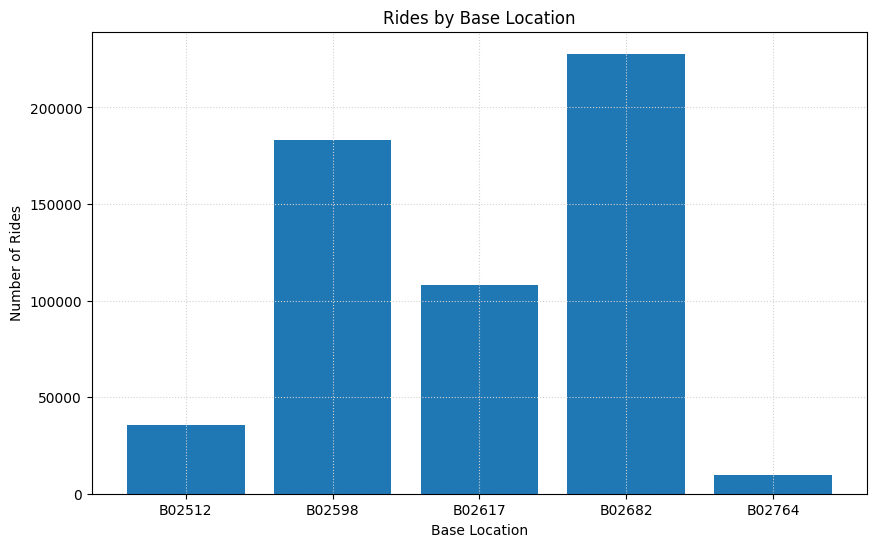

In [14]:
# Analyze rides by base location
rides_by_base = data_april.groupby('Base').size().reset_index(name='Rides')

# Visualize rides by base location
plt.figure(figsize=(10, 6))
plt.grid(color ='lightgray',linestyle='dotted')
plt.bar(rides_by_base['Base'], rides_by_base['Rides'])
plt.xlabel('Base Location')
plt.ylabel('Number of Rides')
plt.title('Rides by Base Location')
plt.show()

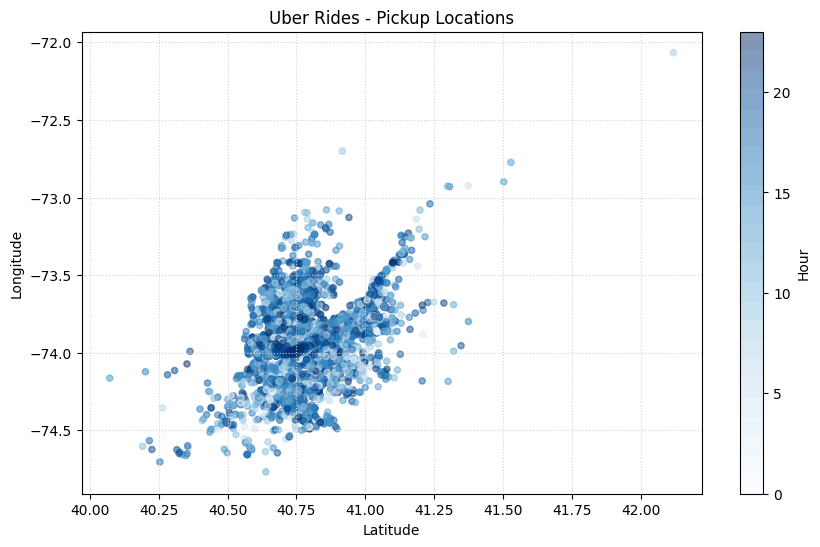

In [15]:
import matplotlib.pyplot as plt

# Define a colormap for the hours
cmap = plt.cm.get_cmap('Blues', 24)

# Create the scatter plot with color-coded hours
plt.figure(figsize=(10, 6))
plt.scatter(
    data_april['Lat'], data_april['Lon'],
    c=data_april['Hour'], cmap=cmap,
    alpha=0.5, s=20
)

plt.ylabel('Longitude')
plt.xlabel('Latitude')
plt.title('Uber Rides - Pickup Locations')
plt.colorbar(label='Hour')  # Add colorbar for hour representation
plt.grid(color='lightgray', linestyle='dotted')
plt.show()


In [18]:
# dynamic heat map over geomap

# These modules are required to create the dynamic heat map and work with geographic maps using Folium.
import folium
from folium.plugins import HeatMapWithTime

# Specify the desired width and height of the map
# These variables define the dimensions (in pixels) of the resulting map.
map_width = 800
map_height = 600

# Create a map with the specified width and height
#This line creates a geographic map centered around the coordinates [40.7128, -74.0060], which corresponds to the location of New York City.
# The zoom_start parameter determines the initial zoom level of the map
map_nyc = folium.Map(location=[40.7128, -74.0060], zoom_start=11, width=map_width, height=map_height)

# Prepare data for the heat map
# This line selects the columns 'Lat', 'Lon', and 'Hour' from the "data_april" DataFrame and converts them into a NumPy array using the .values attribute.
data_heatmap = data_april[['Lat', 'Lon', 'Hour']].values

# Create an empty list to store data for each hour
#This empty list will be populated with data for each hour to be displayed in the HeatMapWithTime layer.
heatmap_data = []

# Iterate over unique hours
for hour in data_april['Hour'].unique():
    # Filter data for the current hour
    hour_data = data_heatmap[data_heatmap[:, 2] == hour][:, :2]
    #The filtered data (latitude and longitude values) is then converted into a nested list and appended to the heatmap_data list.
    heatmap_data.append(hour_data.tolist())

# Create the HeatMapWithTime layer
#The auto_play parameter is set to True, which enables the automatic animation of the heat map over time.
# The radius parameter sets the size of the heat map circles.
heat_layer = HeatMapWithTime(heatmap_data,auto_play=True, radius=8)

# Add the HeatMapWithTime layer to the map
heat_layer.add_to(map_nyc)

# Display the map
map_nyc


In [19]:
# Save the map as an HTML file
map_nyc.save("heatmap.html")


## `Analysis`

- The average number of rides in the month of April is approximately 19,000.

    - The plot of rides versus days shows a consistent pattern throughout each week.

    - Weekends, particularly Sundays, have lower booking activity compared to weekdays, indicating a typical decrease in demand as people tend to rest on weekends.

- Analyzing the number of rides by booking hour reveals two peaks: morning (7-9 am) and evening (5-7 pm), aligning with typical office commute hours.

    - This information can assist the company in improving customer experience by minimizing waiting times through better driver management.

    - The surge pricing mechanism can be optimized based on high demand during peak hours.

- The average number of rides per day per hour plot provides valuable insights into booking patterns.

    - Weekdays exhibit two peaks corresponding to office hours, while Friday and Saturday show an additional peak after 9 pm, suggesting social outings during the weekend.

    - Interestingly, Saturday evenings have more bookings compared to Sunday, likely due to recreational activities and weekend plans.

- Analyzing base location codes offers valuable information for driver distribution, popular pickup locations, and geographical coverage, enabling better driver allocation and business expansion decisions.

    - Base locations B02598 and B02682 consistently show the highest number of bookings.

    - These codes play a crucial role in optimizing driver availability, analyzing demand patterns, and enhancing operational efficiency.

- The scatter plot of latitude and longitude provides a visual representation of pickup locations.

    - The dark blue central area signifies high-demand regions in New York City, with the color bar indicating variations based on the hour of the day.

    - Overlaying the plot on a geographical map can further enhance understanding by providing a visual context of the regions.

- Dynammic heat map significance:

    - By observing the colors on the heat map, you can quickly identify hotspots or regions with a high density of pickups, providing valuable insights into areas of high demand or popular pickup locations. 
    
    - This information can be useful for optimizing driver allocation, understanding customer preferences, and making business decisions related to resource allocation and service expansion.

By conducting these analyses, valuable insights can be derived to optimize operations, improve customer experience, and make data-driven decisions for better business performance.